In [1]:
import os

from cv2 import transform


from distutils.command.config import config
from PIL import Image, ImageDraw
import clip 
import json 
import numpy as np 
import torch 
from torchvision.ops import nms
from torch.utils.data import Dataset, DataLoader, SequentialSampler
import cv2 
import os 
from itertools import chain, combinations
import torch.nn.functional as F
import random
from tqdm import tqdm 

import pprint
from joblib import Parallel, delayed 
import torchvision 
import glob 
from typing import List, Tuple

import torch
from torch import Tensor

In [2]:
# Paths and Constants 
PANO_SLICE_DIRECTORY = '/data1/saaket/lsd_data/data/processed/pano_slices'
TRAIN_PATH = '/data1/saaket/touchdown/data/train.json'
TRAIN_BOX_PATH = '../src/data/sdr_bboxes_train.npy'

In [3]:
class AnchorImageDataset(Dataset):
    def __init__(self, image, coords, transforms):
        self.image = image.copy()
        self.coords = coords
        self.transforms = transforms

    def __len__(self):
        return len(self.coords)

    def __getitem__(self, idx):
        coord = self.coords[idx]
        return self.transforms(self.image.crop(coord))

In [5]:
a = torch.tensor([[2., 3., 4., 5., 1. ,6.], [19., 15., 34., 25., 11. ,61.]])
a.norm(p=2, dim=-1, keepdim=True)
b = a / a.norm(dim=-1, keepdim=True)
b.sum(dim=-1), b

(tensor([2.2014, 2.0940]),
 tensor([[0.2097, 0.3145, 0.4193, 0.5241, 0.1048, 0.6290],
         [0.2411, 0.1904, 0.4315, 0.3173, 0.1396, 0.7741]]))

In [4]:
def get_unique_panos(data_path):
    panoids = []
    with open(data_path) as f:
        for idx, line in enumerate(f):
            obj = json.loads(line)
            panoids.append(obj['main_pano'])
    return np.unique(panoids)

def get_td_text(data_path):
    texts, panoids = [], []
    with open(data_path) as f:
        for idx, line in enumerate(f):
            obj = json.loads(line)
            panoids.append(obj['main_pano'])
            texts.append(obj['td_location_text'])
    return texts, panoids 


train_unique_panos = get_unique_panos('/data1/saaket/touchdown/data/train.json')
dev_unique_panos = get_unique_panos('/data1/saaket/touchdown/data/dev.json')
test_unique_panos = get_unique_panos('/data1/saaket/touchdown/data/test.json')


In [6]:
# img = Image.open('/data1/saaket/lsd_data/data/processed/pano_slices/' + train_unique_panos[0] + '/'  + train_unique_panos[0] + '_1.jpg')
# img1 = img 
# pano_slice_bboxes = train_bboxes[1]
# counter = 0
# for bbox in pano_slice_bboxes:
#     x1, y1, x2, y2 = bbox 

#     if (abs(x2-x1) * abs(y2 - y1)) > 1600:
#         counter += 1
#         draw = ImageDraw.Draw(img1)
#         draw.rectangle((x1, y1, x2, y2), outline=(255, 255, 255))


In [6]:
device = 'cuda:6' if torch.cuda.is_available() else 'cpu'
model, transform = clip.load('ViT-B/32', device=device)

In [7]:
def detect_region(panoid, bboxes, td_text, transform, model):

    def compute_anchor_features(model, device, anchor_loader):
        anchor_features = []
        for anchor_batch in anchor_loader:
            with torch.no_grad():
                anchor_features_ = model.encode_image(anchor_batch.to(device))
            anchor_features.append(anchor_features_)
        
        anchor_features = torch.vstack(anchor_features)
        anchor_features /= anchor_features.norm(p=2, dim=-1, keepdim=True)
        # print('size: ', anchor_features.size())
        # print('norm: ', anchor_features.norm(dim=-1, keepdim=True))
        # print('sum: ', anchor_features.sum(dim=-1, keepdim=True))
        return anchor_features

    pano_slice_features = []
    for i, pano_slice in enumerate(tqdm(os.listdir(f'{PANO_SLICE_DIRECTORY}/{panoid}'))):
    # i = 3
    # pano_slice = 's5hIdomk5NlH-bCnQFDLXQ_3.jpg'
        pano_slice_image = Image.open(PANO_SLICE_DIRECTORY + '/' + panoid + '/' + pano_slice)
        anchor_dataset = AnchorImageDataset(pano_slice_image, bboxes[i], transform)

        anchor_loader = DataLoader(anchor_dataset, 
                batch_size=1000, 
                sampler=SequentialSampler(anchor_dataset),
                pin_memory=False,
                drop_last=False,
                num_workers=8,)
        feat = compute_anchor_features(model, device, anchor_loader)
        pano_slice_features.append(feat)
    
    image_features = torch.vstack(pano_slice_features)
    
    text_arr = td_text.split('.')
    text_arr.remove('')

    tokens = clip.tokenize(text_arr).to(device)
    with torch.no_grad():
        text_features = model.encode_text(tokens)
        text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity_scores = image_features @ text_features.T 
    
    return similarity_scores

    
    
        
            
        

In [8]:
np.where(train_unique_panos == train_panos[0])

NameError: name 'train_panos' is not defined

In [27]:
train_unique_panos[4894], train_panos[0]

('s5hIdomk5NlH-bCnQFDLXQ', 's5hIdomk5NlH-bCnQFDLXQ')

In [9]:
def get_region_scores(idx, panos, td_texts, bboxes, unique_panos):
    ''' I is the id number of example in dataset'''
    
    panoid = panos[idx]
    td_text = td_texts[idx]
    bbox_id = int(np.where(unique_panos == panoid)[0])
    print(bbox_id)
    scores = detect_region(panoid, bboxes[8*bbox_id:8*(1 + bbox_id)], td_text, transform, model)

    return scores 

In [10]:
train_td_texts, train_panos = get_td_text('/data1/saaket/touchdown/data/train.json')
train_bboxes = np.load('../src/data/sdr_bboxes_train.npy', allow_pickle=True)
scores = get_region_scores(1, train_panos, train_td_texts, train_bboxes, train_unique_panos)
# get_region_scores(1, train_panos, train_td_texts, train_bboxes, train_unique_panos)

3949


100%|██████████| 8/8 [00:21<00:00,  2.64s/it]


3949


100%|██████████| 8/8 [00:18<00:00,  2.35s/it]


tensor([[0.1818, 0.1915, 0.1780],
        [0.1874, 0.1841, 0.1759],
        [0.1936, 0.1815, 0.1799],
        ...,
        [0.2384, 0.2462, 0.2206],
        [0.2371, 0.2184, 0.1982],
        [0.2211, 0.2125, 0.1869]], device='cuda:6', dtype=torch.float16)

In [11]:
train_td_texts[1]

"look for a closed garage/security gate on your right side that is black with a yellow mural of a face on it. Stop when you've just passed that mural. The bear is on the right eye of the face in the mural."

In [12]:
def annotate_images(panoid, bboxes, unique_panos):
    images = []
    bbox_id = int(np.where(unique_panos == panoid)[0])
    print(bbox_id)
    for raw_box_id in scores.argmax(dim=0):
        slice_offset = int(raw_box_id) // 1000
        box_num = int(raw_box_id) % 1000
        bbox = bboxes[bbox_id + slice_offset][box_num]
        x1, y1, x2, y2 = bbox 
        img = Image.open(f'{PANO_SLICE_DIRECTORY}/{panoid}/{panoid}_{slice_offset}.jpg' )
        draw = ImageDraw.Draw(img)
        draw.rectangle((x1, y1, x2, y2), outline=(255, 255, 255))
        images.append(img)

    return images 

In [13]:
ann = annotate_images(train_panos[1], train_bboxes, train_unique_panos)

3949


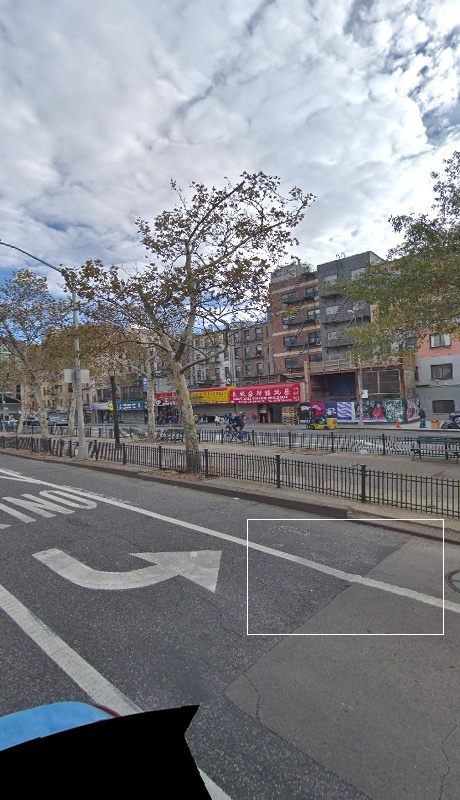

In [16]:
ann[2]

In [68]:

    # pano_slice_bboxes = train_bboxes[1]
# counter = 0
# for bbox in pano_slice_bboxes:
#     x1, y1, x2, y2 = bbox 

#     if (abs(x2-x1) * abs(y2 - y1)) > 1600:
#         counter += 1
#         draw = ImageDraw.Draw(img1)
#         draw.rectangle((x1, y1, x2, y2), outline=(255, 255, 255))

info:  s5hIdomk5NlH-bCnQFDLXQ 6
info:  s5hIdomk5NlH-bCnQFDLXQ 0


In [63]:
box_num

667

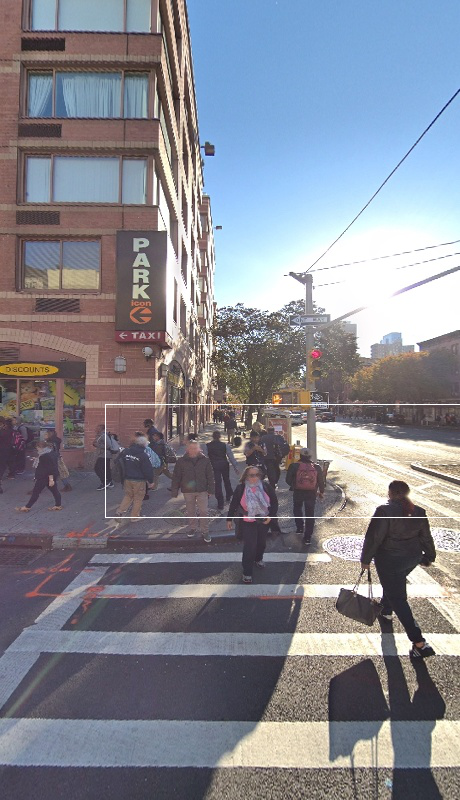

In [69]:
# Image.open(f'/data1/saaket/jpegs_manhattan_touchdown_2021/{panoid}.jpg')
images[0]
# Image.open(f'/data1/saaket/lsd_data/data/processed/pano_slices/s5hIdomk5NlH-bCnQFDLXQ/s5hIdomk5NlH-bCnQFDLXQ_3.jpg')

In [85]:
td_text

"look for a closed garage/security gate on your right side that is black with a yellow mural of a face on it. Stop when you've just passed that mural. The bear is on the right eye of the face in the mural."

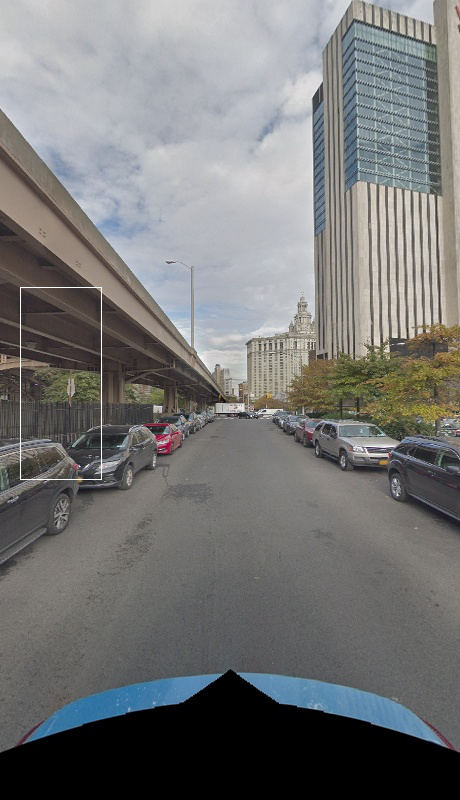

In [82]:
images[1]

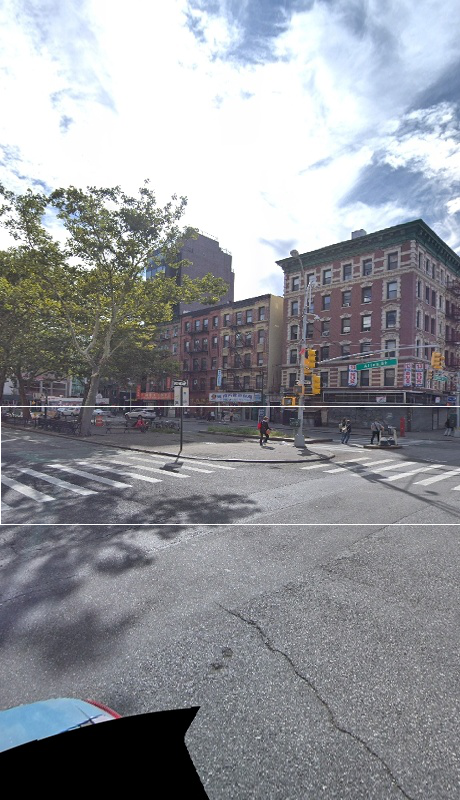

In [57]:
images[1]

In [21]:
slice_num = 
box_num = 2963 % 1000 

963

In [5]:
for pid in train_bboxes:
    for b in pid: 
        if b[1] > 460:
            print(pid)

[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [177 404 196 419]
 ...
 [  0 339  56 775]
 [  0 330  36 524]
 [389 757 421 800]]
[[133 406 179 431]
 [180 404 199 418]
 [

KeyboardInterrupt: 

In [45]:


def compute_best_bboxes(data_path, coords, model, device, transform):
    with open(data_path) as f:
        best_boxes = []
        for idx, line in enumerate(tqdm(f)):
            obj = json.loads(line)
            panoid = obj['main_pano']
            td_location_text = obj['td_location_text']
            pano_slice_features = []
            for jdx, pano_slice in enumerate(os.listdir(PANO_SLICE_DIRECTORY + '/' + panoid)):
                pano_slice_image = Image.open(PANO_SLICE_DIRECTORY + '/' + panoid + '/' + pano_slice)
                anchor_dataset = AnchorImageDataset(pano_slice_image, coords[8*idx + jdx], transform)
                anchor_loader = DataLoader(anchor_dataset, 
                        batch_size=32, 
                        sampler=SequentialSampler(anchor_dataset),
                        pin_memory=False,
                        drop_last=False,
                        num_workers=2,)
                
                anchor_features = compute_anchor_features(model, device, anchor_loader) 
                pano_slice_features.append(anchor_features)
            
            image_features = torch.vstack(pano_slice_features)
            tokens = clip.tokenize(td_location_text.split('.'), truncate=True).to(device)
            with torch.no_grad():
                text_features = model.encode_text(tokens)
            similarity = text_features @ image_features.T
            similarity = similarity.detach().cpu()
            best_bboxes = similarity.argmax(dim=-1)
            best_boxes.extend(best_bboxes.tolist()) 
    return best_bboxes 
            

In [18]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
model, transform = clip.load('RN50', device=device)

In [36]:
a = torch.randn((4, 4)); a

tensor([[-0.2761,  0.6557, -1.0195,  0.7330],
        [-0.9520, -0.2863, -1.0196, -0.1518],
        [ 1.5176, -0.2458, -1.4597,  0.3466],
        [ 1.2513, -1.0785,  0.7183,  1.0071]])

In [41]:
a.argmax(dim=-1)

tensor([3, 3, 0, 0])

In [39]:
a[a.argmax(dim=-1)]

tensor([[ 1.2513, -1.0785,  0.7183,  1.0071],
        [ 1.2513, -1.0785,  0.7183,  1.0071],
        [-0.2761,  0.6557, -1.0195,  0.7330],
        [-0.2761,  0.6557, -1.0195,  0.7330]])

In [46]:
feat = compute_best_bboxes(TRAIN_PATH, train_bboxes, model, device, transform)

1it [00:13, 13.26s/it]


KeyboardInterrupt: 